In [1]:
import os, time
import numpy as np
import pandas as pd
import geopandas as gpd
from matplotlib import pyplot as plt

%matplotlib inline
plt.rcParams['figure.figsize'] = [60, 40]

In [2]:
edu_data = pd.read_csv('../data/census tract data/Education attainment/ACSST5Y2019.S1501_data_with_overlays_2021-03-29T073610.csv', 
                       encoding='utf-8', skiprows=1)
list(edu_data.columns)

['id',
 'Geographic Area Name',
 'Estimate!!Total!!AGE BY EDUCATIONAL ATTAINMENT!!Population 18 to 24 years',
 'Margin of Error!!Total!!AGE BY EDUCATIONAL ATTAINMENT!!Population 18 to 24 years',
 'Estimate!!Total!!AGE BY EDUCATIONAL ATTAINMENT!!Population 18 to 24 years!!Less than high school graduate',
 'Margin of Error!!Total!!AGE BY EDUCATIONAL ATTAINMENT!!Population 18 to 24 years!!Less than high school graduate',
 'Estimate!!Total!!AGE BY EDUCATIONAL ATTAINMENT!!Population 18 to 24 years!!High school graduate (includes equivalency)',
 'Margin of Error!!Total!!AGE BY EDUCATIONAL ATTAINMENT!!Population 18 to 24 years!!High school graduate (includes equivalency)',
 "Estimate!!Total!!AGE BY EDUCATIONAL ATTAINMENT!!Population 18 to 24 years!!Some college or associate's degree",
 "Margin of Error!!Total!!AGE BY EDUCATIONAL ATTAINMENT!!Population 18 to 24 years!!Some college or associate's degree",
 "Estimate!!Total!!AGE BY EDUCATIONAL ATTAINMENT!!Population 18 to 24 years!!Bachelor's de

In [6]:
cols = [
    'id',
    'Estimate!!Total!!AGE BY EDUCATIONAL ATTAINMENT!!Population 18 to 24 years',
    'Estimate!!Total!!AGE BY EDUCATIONAL ATTAINMENT!!Population 25 years and over',
    'Geographic Area Name',
    'Estimate!!Total!!AGE BY EDUCATIONAL ATTAINMENT!!Population 18 to 24 years!!Less than high school graduate',
    'Estimate!!Total!!AGE BY EDUCATIONAL ATTAINMENT!!Population 18 to 24 years!!High school graduate (includes equivalency)',
    "Estimate!!Total!!AGE BY EDUCATIONAL ATTAINMENT!!Population 18 to 24 years!!Some college or associate's degree",
    "Estimate!!Total!!AGE BY EDUCATIONAL ATTAINMENT!!Population 18 to 24 years!!Bachelor's degree or higher",
    "Estimate!!Total!!AGE BY EDUCATIONAL ATTAINMENT!!Population 25 years and over!!Less than 9th grade",
    "Estimate!!Total!!AGE BY EDUCATIONAL ATTAINMENT!!Population 25 years and over!!9th to 12th grade, no diploma",
    "Estimate!!Total!!AGE BY EDUCATIONAL ATTAINMENT!!Population 25 years and over!!High school graduate (includes equivalency)",
    "Estimate!!Total!!AGE BY EDUCATIONAL ATTAINMENT!!Population 25 years and over!!Some college, no degree",
    "Estimate!!Total!!AGE BY EDUCATIONAL ATTAINMENT!!Population 25 years and over!!Associate's degree",
    "Estimate!!Total!!AGE BY EDUCATIONAL ATTAINMENT!!Population 25 years and over!!Bachelor's degree",
    "Estimate!!Total!!AGE BY EDUCATIONAL ATTAINMENT!!Population 25 years and over!!Graduate or professional degree",
    "Estimate!!Total!!AGE BY EDUCATIONAL ATTAINMENT!!Population 25 years and over!!High school graduate or higher",
    "Estimate!!Total!!AGE BY EDUCATIONAL ATTAINMENT!!Population 25 years and over!!Bachelor's degree or higher",
]
len(cols)

17

In [7]:
len(set(edu_data['id'])) == len(edu_data)

True

In [7]:
edu_data[cols].to_csv('needed.csv', encoding='utf8', index=None)

In [15]:
mass = gpd.read_file("../data/cb_2018_25_tract_500k/cb_2018_25_tract_500k.shp")
# mass

In [16]:
mass = pd.merge(mass, edu_data[['id', 'Geographic Area Name'] + cols], left_on='AFFGEOID', right_on='id')
# mass

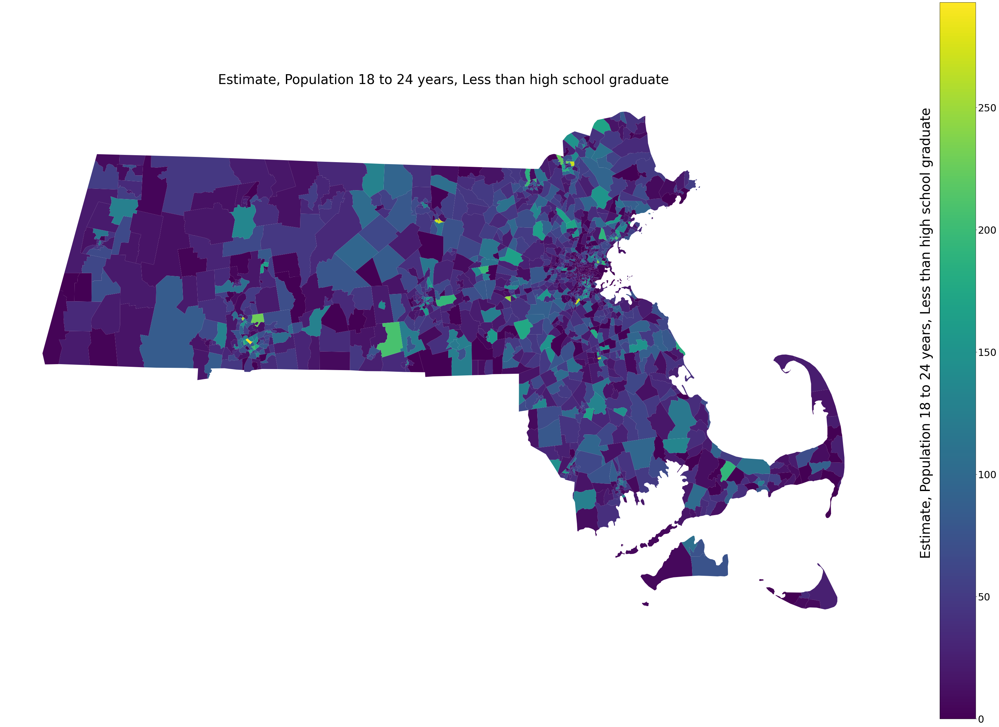

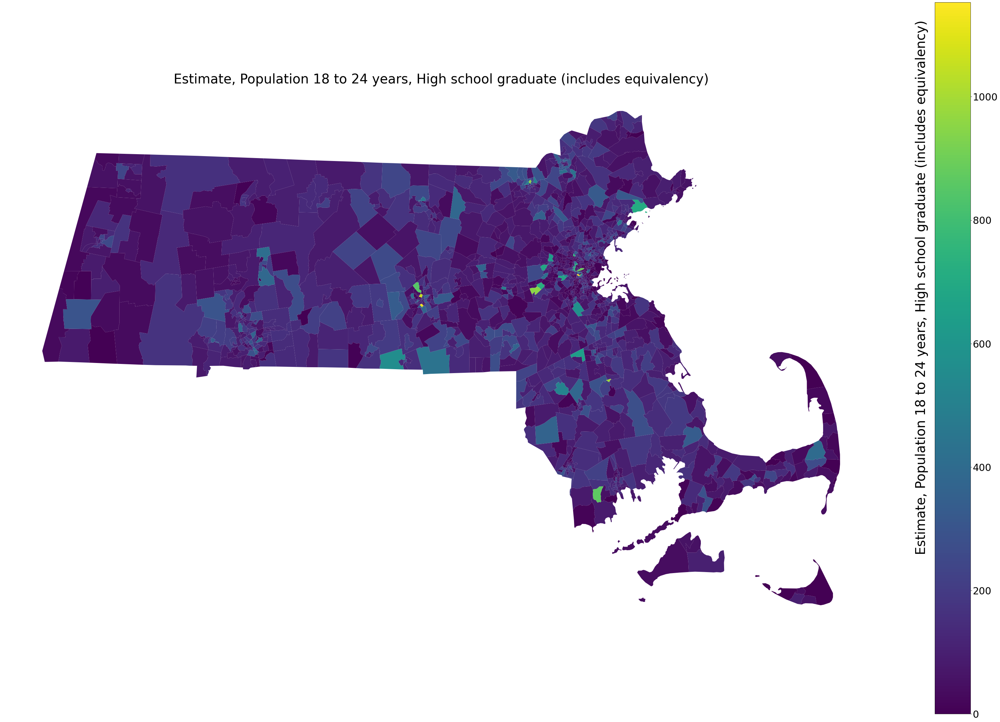

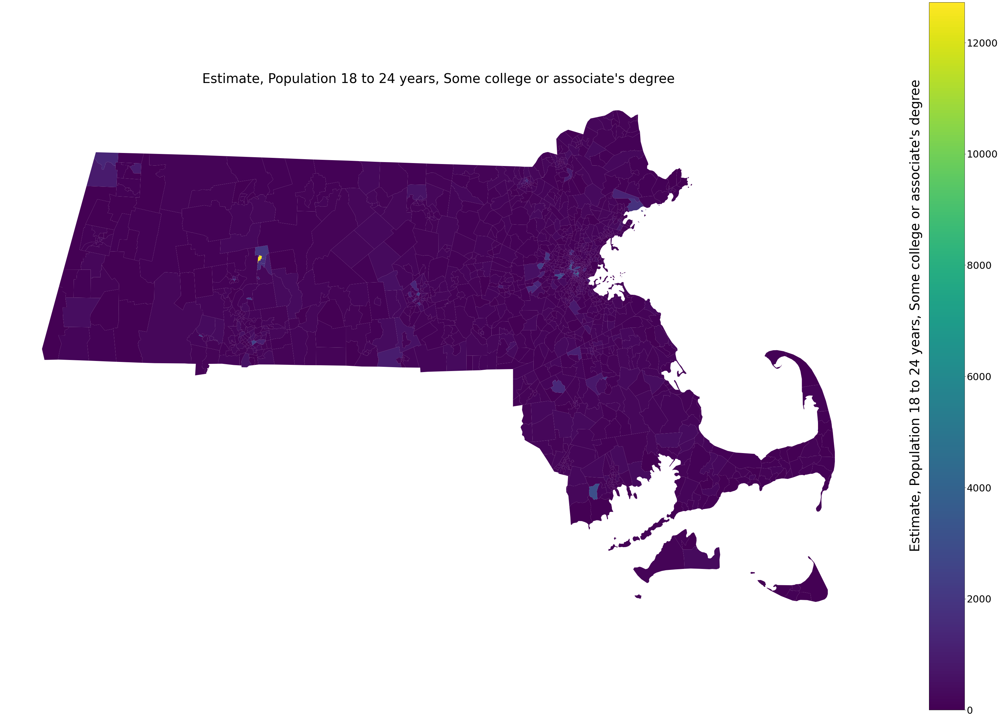

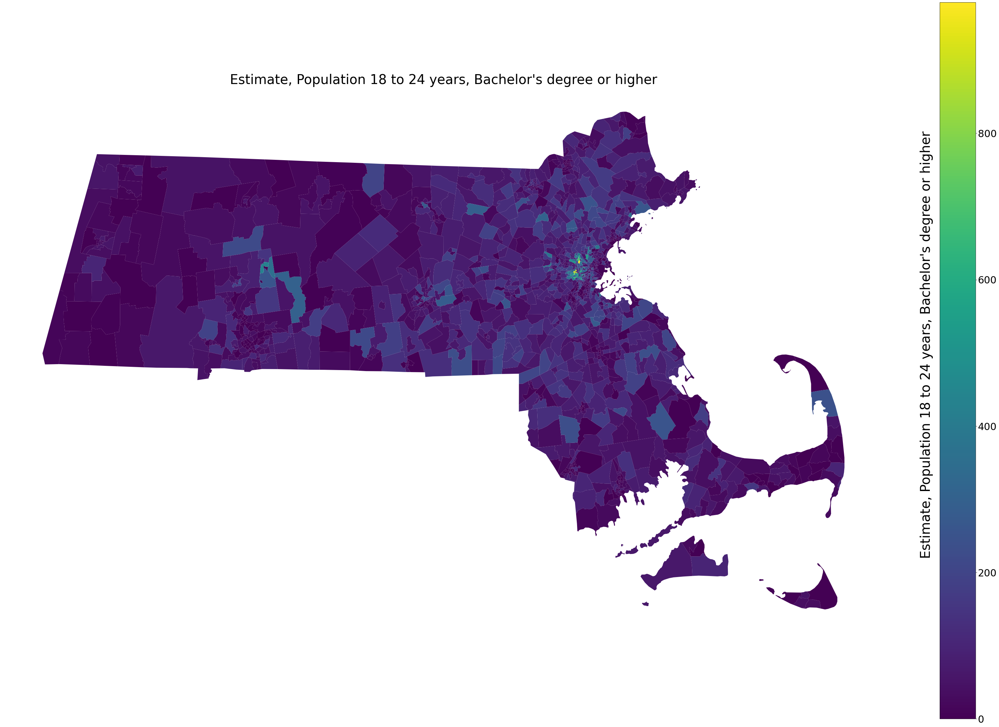

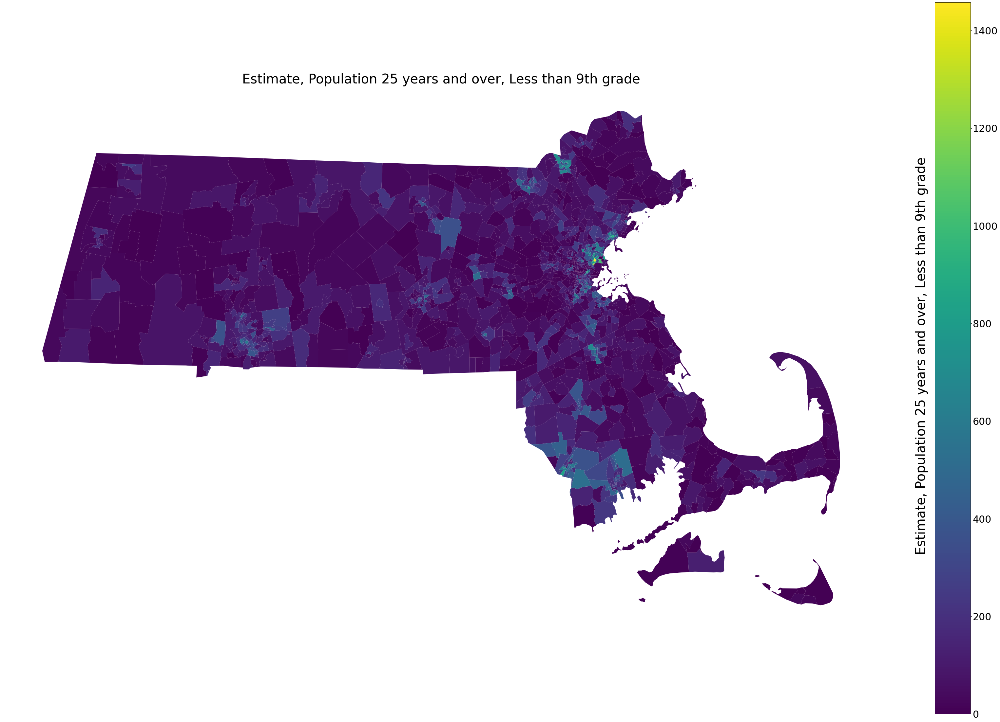

...

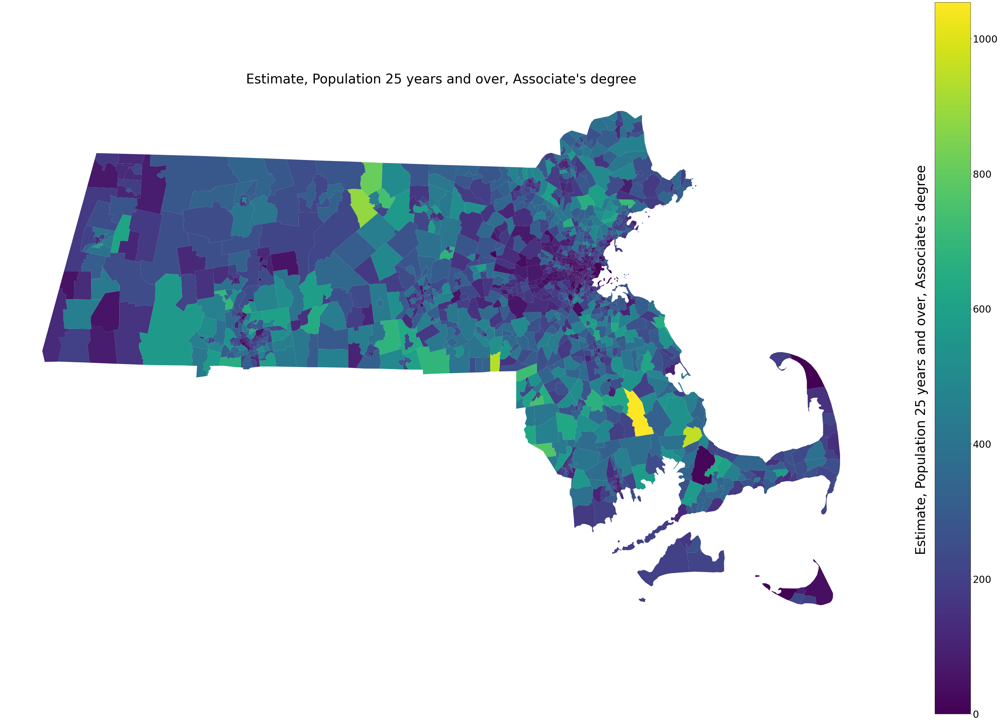

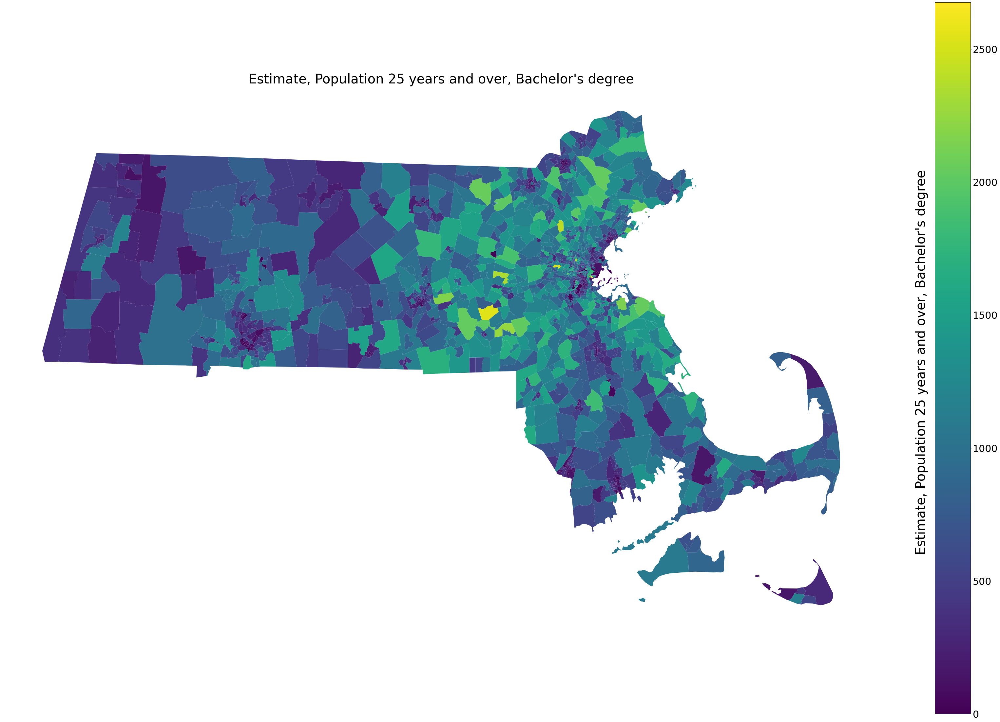

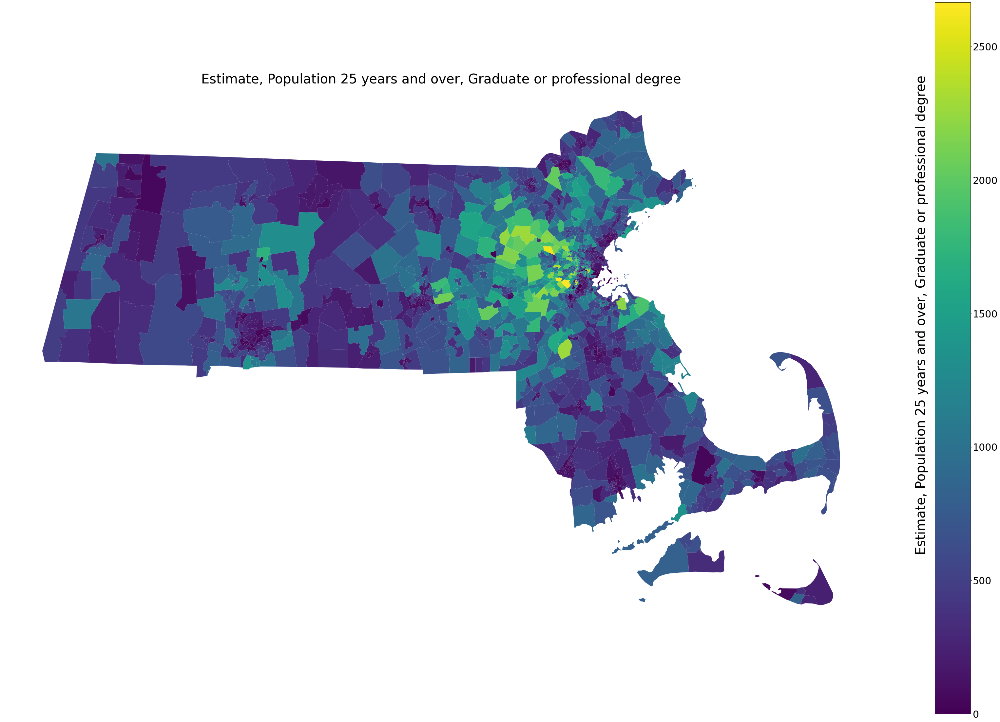

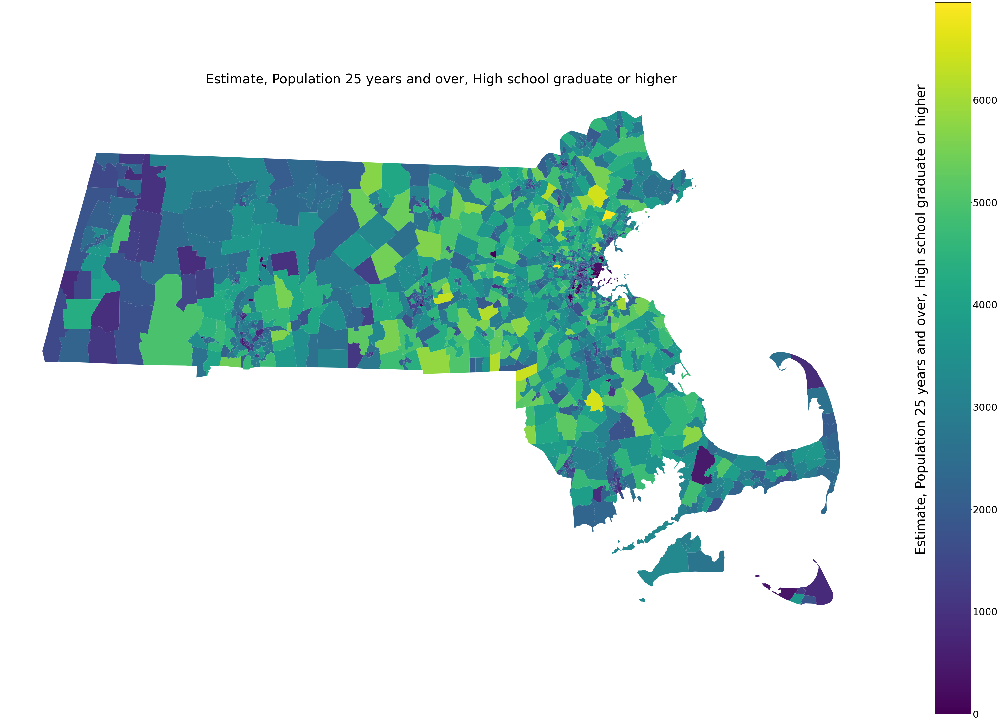

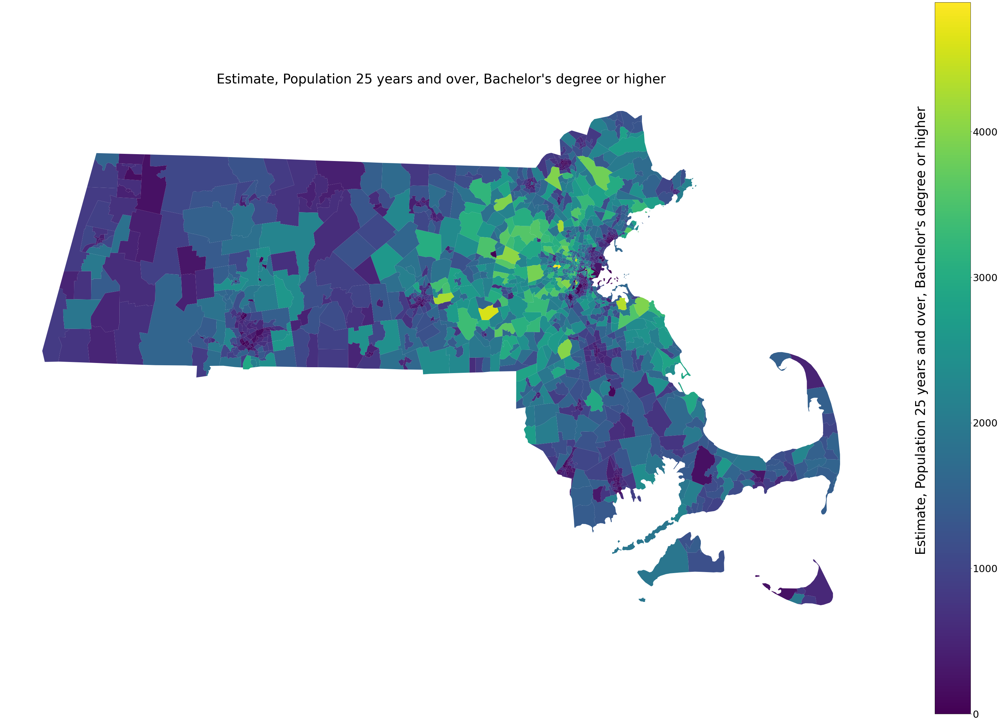

In [11]:
for col in cols[:]:
    splits = col.split('!!')
    title = ', '.join([splits[0], splits[-2], splits[-1]])
    
    ax = mass.plot(column=col, legend = True)
    fig = ax.figure
    color_bar = fig.axes[1]
    color_bar.tick_params(labelsize=30)
    #Bounds supplies information on the maximum and minimum values of the x-axis and y-axis of our plot.
    bounds = mass.bounds.iloc[3]
    minx = bounds["minx"]
    miny = bounds["miny"]
#     print(bounds, '\n')

    # We use that information to place the text label for our legend
    plt.text(minx + 1.5, miny - 1, title, fontsize=40, rotation=90, rotation_mode='anchor')
    plt.title(title, fontsize = 40)
    plt.axis('off')
    plt.savefig('../data/census tract data/Education attainment/'+title+'.png')

In [18]:
mass.to_csv('../data/census tract data/Education attainment/mass.csv', encoding='utf8', index=None)